<a href="https://colab.research.google.com/github/chanarat989/word_segmentation_model/blob/main/cnn_mosquito_category_CH.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#CNN-Image classification

In [ ]:
import numpy as np
#import cv2
import cv2 as cv
from os import listdir
from os.path import isfile, join
from tqdm import tqdm
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten , Conv2D, MaxPool2D
import matplotlib.pyplot as plt


In [ ]:
!wget http://techno.varee.ac.th/colab/mosquito.zip
!unzip --qq mosquito.zip

--2023-11-04 18:36:12--  http://techno.varee.ac.th/colab/mosquito.zip
Resolving techno.varee.ac.th (techno.varee.ac.th)... 104.21.72.84, 172.67.177.141, 2606:4700:3033::ac43:b18d, ...
Connecting to techno.varee.ac.th (techno.varee.ac.th)|104.21.72.84|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28715057 (27M) [application/zip]
Saving to: ‘mosquito.zip’

mosquito.zip        100%[===================>]  27.38M   970KB/s    in 34s     

2023-11-04 18:36:46 (834 KB/s) - ‘mosquito.zip’ saved [28715057/28715057]



(<Axes: >, <matplotlib.image.AxesImage at 0x7ab1a8a35fc0>)

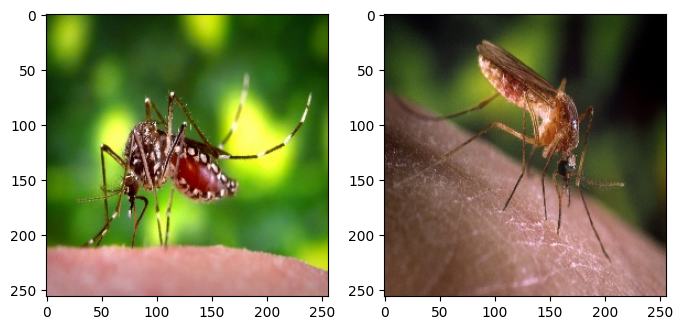

In [ ]:
img1 = cv.imread('/content/train/Aedes/Aedes1.jpg')
img1 = cv.cvtColor(img1 , cv.COLOR_BGR2RGB)

img2 = cv.imread('/content/train/Culex/Culex1.jpg')
img2 = cv.cvtColor(img2 , cv.COLOR_BGR2RGB)

plt.figure(figsize=(8,4))
plt.subplot(121),plt.imshow(img1)
plt.subplot(122),plt.imshow(img2)

In [ ]:
width = 128
num_classes = 2
trainpath = 'train/'
testpath = 'test/'
trainImg = [trainpath+f for f in listdir(trainpath)]
testImg = [testpath+f for f in listdir(testpath)]

In [ ]:
trainImg , testImg

(['train/Aedes', 'train/Culex'], ['test/Aedes', 'test/Culex'])

In [ ]:
def img2data(path):
  rawImgs = []
  labels = []

  for imagePath in (path):
      for item in tqdm(listdir(imagePath)):
          file = join(imagePath, item)
          if file[-1] =='g':
            img = cv.imread(file , cv.COLOR_BGR2RGB)
            img = cv.resize(img ,(width,width))
            rawImgs.append(img)

            l = imagePath.split('/')[1]

            if l == 'Aedes':
              labels.append([1,0])
            elif l == 'Culex':
              labels.append([0,1])



  return rawImgs, labels

In [ ]:
x_train, y_train = img2data(trainImg)
x_test, y_test = img2data(testImg)

100%|██████████| 30/30 [00:00<00:00, 1108.67it/s]


In [ ]:
x_train = np.array(x_train)
y_train = np.array(y_train)
x_test = np.array(x_test)
y_test = np.array(y_test)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255

In [ ]:
x_train.shape,y_train.shape,x_test.shape, y_test.shape

((1200, 128, 128, 3), (1200, 2), (60, 128, 128, 3), (60, 2))

In [ ]:
model0 = Sequential([
        Conv2D(128, (3,3), activation='relu', input_shape=(width, width, 3)),
         MaxPool2D(pool_size=(2,2 )),
        Conv2D(128,(3,3) , activation='relu'),
        MaxPool2D(pool_size=(2,2 )),
        Dense(16),
        Flatten(),

        Dense(num_classes, activation='softmax')
    ])
#Dense(num_classes, activation='softmax') #softmax for one hot . . # sigmoid for 0/1

In [ ]:
model0.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 128)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 128)       147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 128)       0         
 g2D)                                                            
                                                                 
 dense (Dense)               (None, 30, 30, 16)        2064      
                                                                 
 flatten (Flatten)           (None, 14400)             0

In [ ]:
model0.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics= ['accuracy'])
batch_size = 32
epochs = 10

In [ ]:
history = model0.fit(x_train, y_train ,batch_size=batch_size, epochs=epochs ,validation_data=(x_test, y_test))


Epoch 1/10
38/38 [==============================] - 80s 2s/step - loss: 0.5383 - accuracy: 0.7192 - val_loss: 0.6442 - val_accuracy: 0.7500
Epoch 2/10
38/38 [==============================] - 77s 2s/step - loss: 0.1811 - accuracy: 0.9392 - val_loss: 0.1511 - val_accuracy: 0.9333
Epoch 3/10
38/38 [==============================] - 77s 2s/step - loss: 0.1213 - accuracy: 0.9550 - val_loss: 0.2433 - val_accuracy: 0.9167
Epoch 4/10
38/38 [==============================] - 78s 2s/step - loss: 0.0981 - accuracy: 0.9658 - val_loss: 0.2141 - val_accuracy: 0.9500
Epoch 5/10
38/38 [==============================] - 78s 2s/step - loss: 0.0537 - accuracy: 0.9792 - val_loss: 0.1448 - val_accuracy: 0.9500
Epoch 6/10
38/38 [==============================] - 77s 2s/step - loss: 0.0602 - accuracy: 0.9783 - val_loss: 0.0995 - val_accuracy: 0.9833
Epoch 7/10
38/38 [==============================] - 76s 2s/step - loss: 0.0175 - accuracy: 0.9967 - val_loss: 0.1308 - val_accuracy: 0.9667
Epoch 8/10
38/38 [==

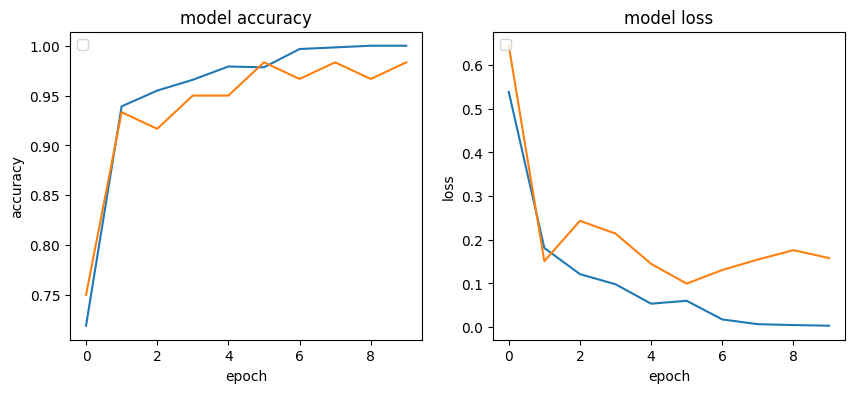

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,4))
plt.subplot(121),
plt.title('model accuracy');plt.ylabel('accuracy');plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.plot(history.history['accuracy']);plt.plot(history.history['val_accuracy'])

plt.subplot(122)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.plot(history.history['loss']);plt.plot(history.history['val_loss'])


In [ ]:
#testpath = 'test/'
testpath = 'newmosquito/'

testImg = [testpath+f for f in listdir(testpath)]
for imagePath in (testImg):
    for i,item in enumerate(listdir(imagePath)):
        file = join(imagePath, item)
        print(file)

newmosquito/n1/Culex_quinquefasciatus_2022_001.jpg
newmosquito/n1/Aedes1.jpg
newmosquito/n1/Culex_quinquefasciatus_.jpg
newmosquito/n1/Aedes2.jpg
newmosquito/n1/Culex_quinquefasciatus_2022_005.jpg
newmosquito/n1/Aedes_aegypti.jpg


newmosquito/n1/Culex_quinquefasciatus_2022_001.jpg
1/1 [==============================] - 0s 100ms/step
predict:[[9.9968135e-01 3.1871829e-04]]
real:Culex_quinquefasciatus_2022_001.jpg
predict:Aedes


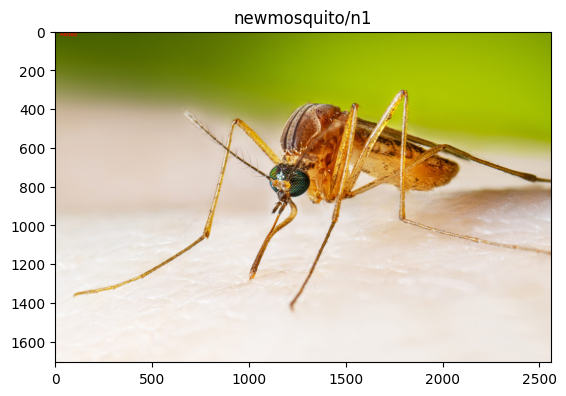

newmosquito/n1/Aedes1.jpg
1/1 [==============================] - 0s 37ms/step
predict:[[9.9999893e-01 1.0727429e-06]]
real:Aedes1.jpg
predict:Aedes


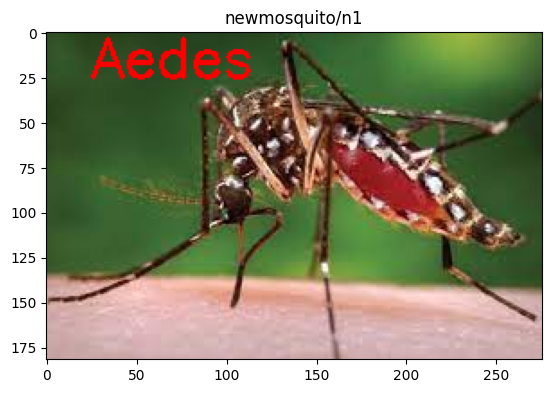

newmosquito/n1/Culex_quinquefasciatus_.jpg
1/1 [==============================] - 0s 31ms/step
predict:[[9.1624825e-04 9.9908376e-01]]
real:Culex_quinquefasciatus_.jpg
predict:Culex


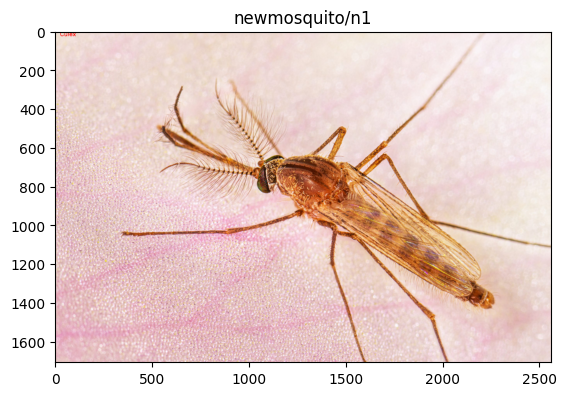

newmosquito/n1/Aedes2.jpg
1/1 [==============================] - 0s 47ms/step
predict:[[1.2451141e-05 9.9998760e-01]]
real:Aedes2.jpg
predict:Culex


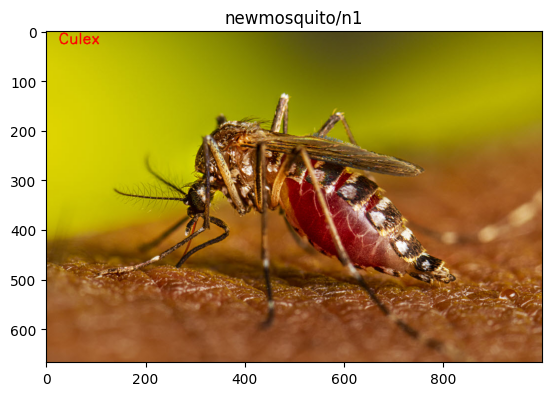

newmosquito/n1/Culex_quinquefasciatus_2022_005.jpg
1/1 [==============================] - 0s 32ms/step
predict:[[0.0015791  0.99842095]]
real:Culex_quinquefasciatus_2022_005.jpg
predict:Culex


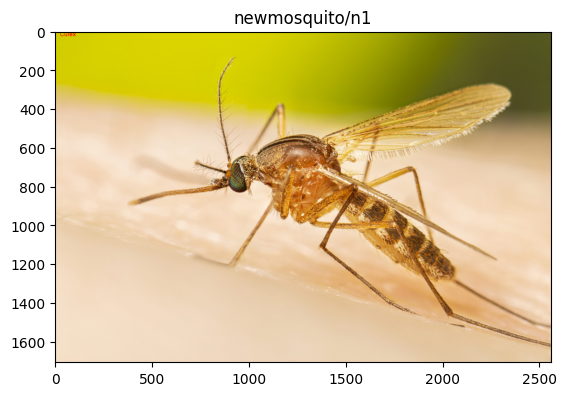

newmosquito/n1/Aedes_aegypti.jpg
1/1 [==============================] - 0s 33ms/step
predict:[[0.06282395 0.937176  ]]
real:Aedes_aegypti.jpg
predict:Culex


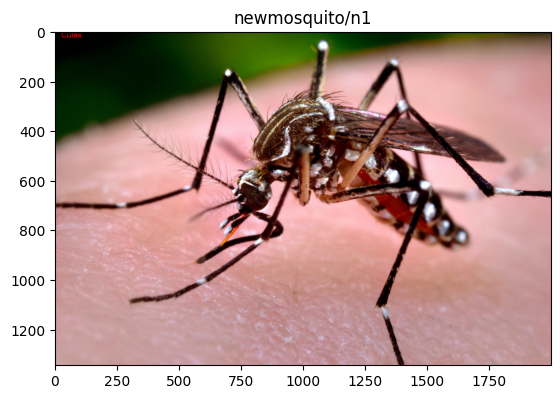

In [ ]:
#testpath = 'test/'
testpath = 'newmosquito/'
testImg = [testpath+f for f in listdir(testpath)]
rimg = []
for imagePath in (testImg):
    for i,item in enumerate(listdir(imagePath)):

        file = join(imagePath, item)
        if file[-1] =='g':
          print(file)
          imgori = cv.imread(file)
          imgori = cv.cvtColor(imgori , cv.COLOR_BGR2RGB)
          img = cv.resize(imgori ,(width,width))
          rimg = np.array(img)
          rimg = rimg.astype('float32')
          rimg /= 255
          rimg = np.reshape(rimg ,(1,128,128,3))
          predict = model0.predict(rimg)
          label = ['Aedes','Culex']
          result = label[np.argmax(predict)]
          print('predict:' +str(predict))
          print('real:' +str(item))
          print('predict:' +str(result))
          plt.title(imagePath)
          cv.putText(imgori, str(result), (25,25), cv.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2 )

          plt.imshow(imgori)
          plt.show()


In [ ]:
model0.save("model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


4. Prepare for transfer learning and finetuning
Add the new classification head
Decide whether to freeze or unfreeze any pretrained layers

In [ ]:
### 4.1 Access and freeze layer(s) in Keras's model

In [ ]:
base_model = tf.keras.applications.MobileNetV2(input_shape=(128,128,3),
                                                   include_top=False,
                                                   weights='imagenet')

base_model.trainable = False

In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_128"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 64, 64, 32)           864       ['input_3[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 64, 64, 32)           128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 64, 64, 32)           0         ['bn_Conv1[

In [ ]:
### 4.2 Add a new classification head

In [ ]:
num_classes = 2

model = Sequential([
        base_model,
        Conv2D(128, 3, activation='relu'),
        MaxPool2D(pool_size=(2,2 )),
        Dropout(0.25),
        Dense(16),
        Flatten(),
        Dense(num_classes, activation='softmax')
    ])


#     Conv2D(128, (3,3), activation='relu', input_shape=(width, width, 3)),
#         MaxPool2D(pool_size=(2,2 )),
#        Conv2D(128,(3,3) , activation='relu'),
#        MaxPool2D(pool_size=(2,2 )),
#        Dense(16),
#        Flatten(),


In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_128 (Func  (None, 4, 4, 1280)        2257984   
 tional)                                                         
                                                                 
 conv2d_4 (Conv2D)           (None, 2, 2, 128)         1474688   
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 1, 1, 128)         0         
 g2D)                                                            
                                                                 
 dropout_2 (Dropout)         (None, 1, 1, 128)         0         
                                                                 
 dense_6 (Dense)             (None, 1, 1, 16)          2064      
                                                                 
 flatten_3 (Flatten)         (None, 16)               

In [ ]:
####5. Train the model with transfer learning

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics= ['accuracy'])
batch_size = 32
epochs = 10

In [ ]:
history = model.fit(x_train, y_train ,batch_size=batch_size, epochs=epochs ,validation_data=(x_test, y_test))

Epoch 1/10
38/38 [==============================] - 11s 232ms/step - loss: 0.0038 - accuracy: 0.9992 - val_loss: 1.6987e-06 - val_accuracy: 1.0000
Epoch 2/10
38/38 [==============================] - 8s 204ms/step - loss: 4.1623e-05 - accuracy: 1.0000 - val_loss: 3.7750e-08 - val_accuracy: 1.0000
Epoch 3/10
38/38 [==============================] - 8s 219ms/step - loss: 0.0023 - accuracy: 0.9992 - val_loss: 1.3312e-07 - val_accuracy: 1.0000
Epoch 4/10
38/38 [==============================] - 9s 229ms/step - loss: 0.0196 - accuracy: 0.9975 - val_loss: 1.0171e-05 - val_accuracy: 1.0000
Epoch 5/10
38/38 [==============================] - 8s 205ms/step - loss: 0.0219 - accuracy: 0.9950 - val_loss: 0.0180 - val_accuracy: 0.9833
Epoch 6/10
38/38 [==============================] - 8s 217ms/step - loss: 0.0130 - accuracy: 0.9983 - val_loss: 0.2106 - val_accuracy: 0.9833
Epoch 7/10
38/38 [==============================] - 8s 219ms/step - loss: 0.0029 - accuracy: 0.9983 - val_loss: 4.1978e-05 - va

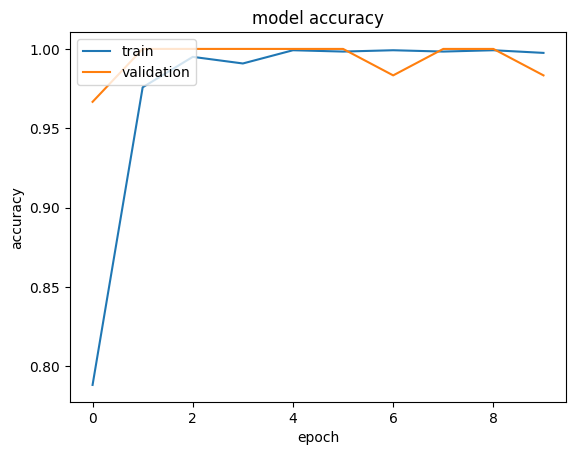

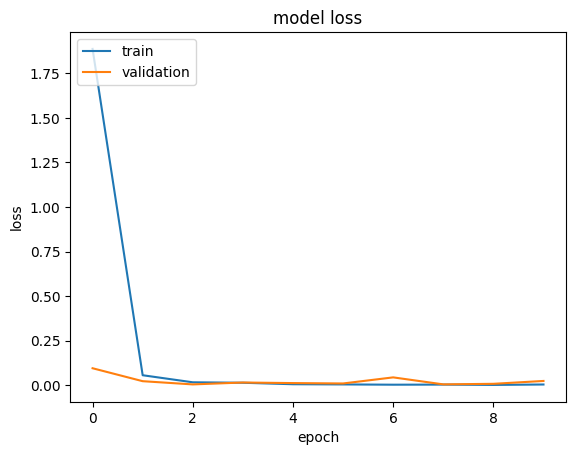

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [ ]:
# Test new model with new image

newmosquito/n1/Culex_quinquefasciatus_2022_001.jpg
1/1 [==============================] - 0s 39ms/step
predict:[[9.9968135e-01 3.1871829e-04]]
real:Culex_quinquefasciatus_2022_001.jpg
predict:Aedes


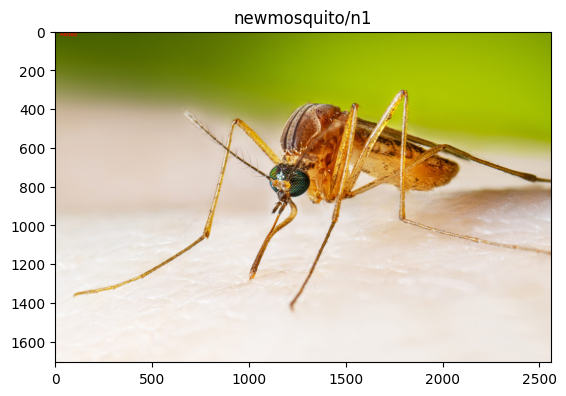

newmosquito/n1/Aedes1.jpg
1/1 [==============================] - 0s 35ms/step
predict:[[9.9999893e-01 1.0727429e-06]]
real:Aedes1.jpg
predict:Aedes


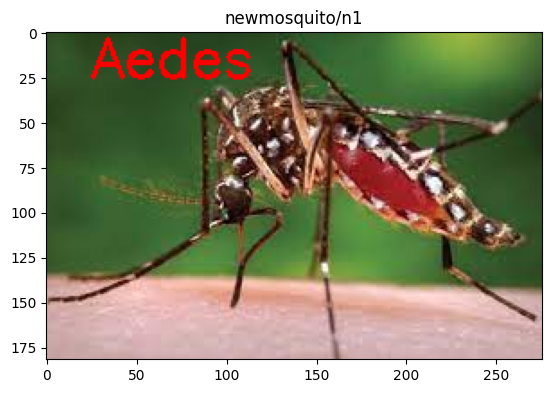

newmosquito/n1/Culex_quinquefasciatus_.jpg
1/1 [==============================] - 0s 29ms/step
predict:[[9.1624825e-04 9.9908376e-01]]
real:Culex_quinquefasciatus_.jpg
predict:Culex


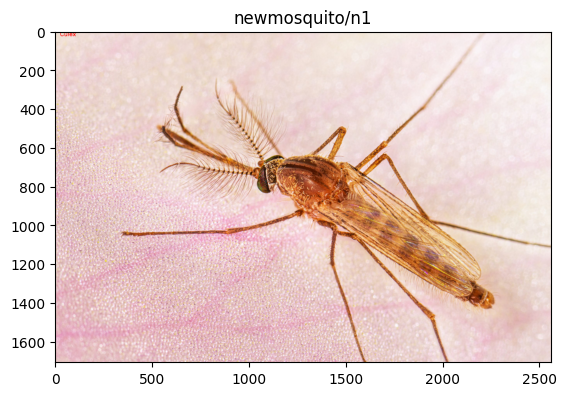

newmosquito/n1/Aedes2.jpg
1/1 [==============================] - 0s 42ms/step
predict:[[1.2451141e-05 9.9998760e-01]]
real:Aedes2.jpg
predict:Culex


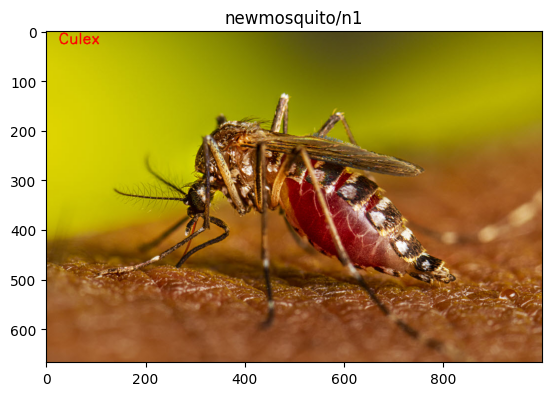

newmosquito/n1/Culex_quinquefasciatus_2022_005.jpg
1/1 [==============================] - 0s 30ms/step
predict:[[0.0015791  0.99842095]]
real:Culex_quinquefasciatus_2022_005.jpg
predict:Culex


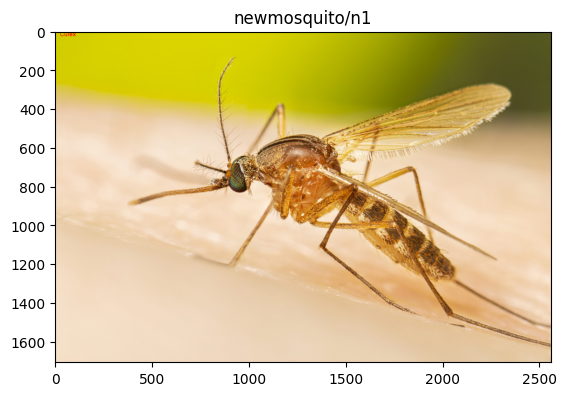

newmosquito/n1/Aedes_aegypti.jpg
1/1 [==============================] - 0s 31ms/step
predict:[[0.06282395 0.937176  ]]
real:Aedes_aegypti.jpg
predict:Culex


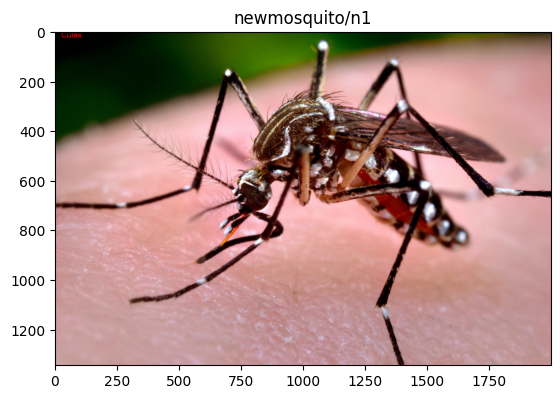

In [ ]:
#testpath = 'test/'
testpath = 'newmosquito/'
testImg = [testpath+f for f in listdir(testpath)]
rimg = []
for imagePath in (testImg):
    for i,item in enumerate(listdir(imagePath)):

        file = join(imagePath, item)
        if file[-1] =='g':
          print(file)
          imgori = cv.imread(file)
          imgori = cv.cvtColor(imgori , cv.COLOR_BGR2RGB)
          img = cv.resize(imgori ,(width,width))
          rimg = np.array(img)
          rimg = rimg.astype('float32')
          rimg /= 255
          rimg = np.reshape(rimg ,(1,128,128,3))
          predict = model0.predict(rimg)
          label = ['Aedes','Culex']
          result = label[np.argmax(predict)]
          print('predict:' +str(predict))
          print('real:' +str(item))
          print('predict:' +str(result))
          plt.title(imagePath)
          cv.putText(imgori, str(result), (25,25), cv.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2 )

          plt.imshow(imgori)
          plt.show()

#Inference

In [ ]:
plt.rcParams["axes.linewidth"] = 5

def color_frame( ax, y_true, y_pred ):
  color = 'green' if (y_true == y_pred) else 'red'
  ax.spines['bottom'].set_color(color)
  ax.spines['top'].set_color(color)
  ax.spines['right'].set_color(color)
  ax.spines['left'].set_color(color)

samples.shape=(20, 128, 128, 3)
1/1 [==============================] - 1s 1s/step
Axes(0.125,0.11;0.775x0.77)
[1 0]
0


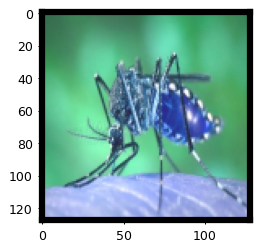

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


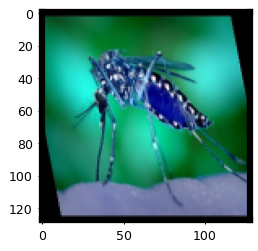

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


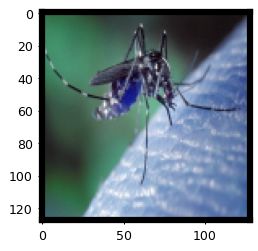

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


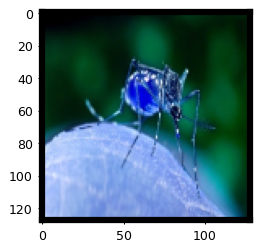

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


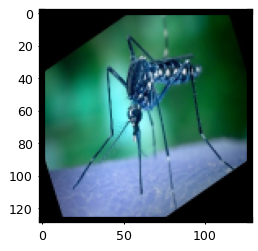

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


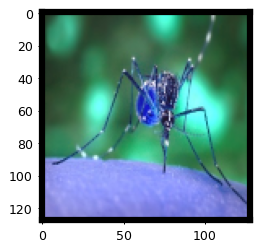

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


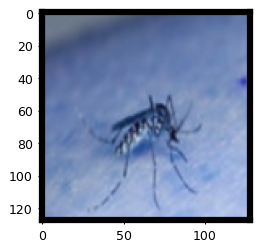

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


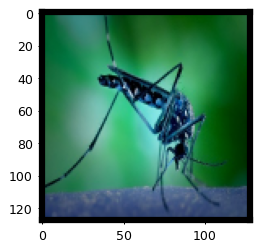

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


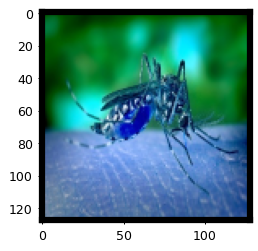

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


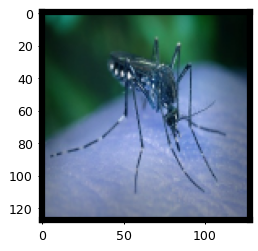

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


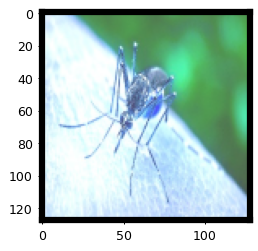

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


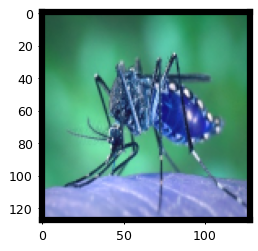

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


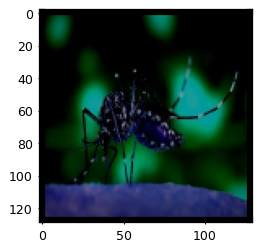

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


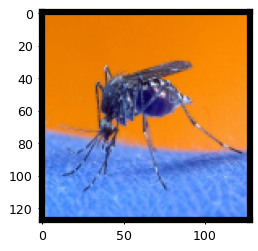

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


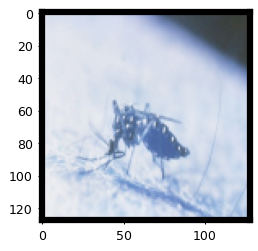

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


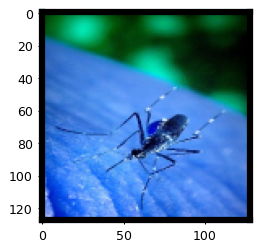

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


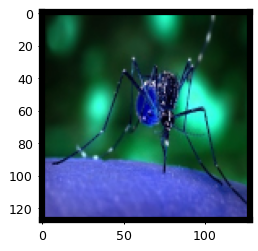

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


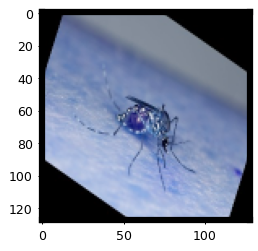

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


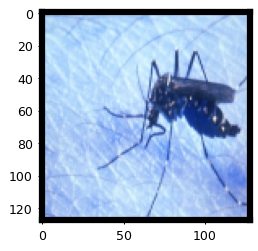

Axes(0.125,0.11;0.775x0.77)
[1 0]
0


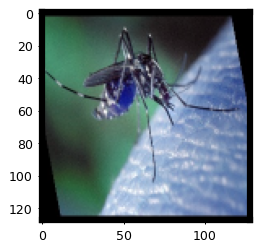

In [ ]:
# Test using the model on many images
cifar10_labels = [ 'Aedes', 'Culex']

# Get a batch of samples
n = 20
samples = x_test[:n]
print(f'{samples.shape=}')

# Predict a batch of samples
y_pred = model.predict(samples)

# Interpret the results
for i in range(n):
  plt.figure(figsize=(3,3), dpi=90)
  ax = plt.gca()
  plt.imshow( x_test[i] )
  #plt.title( f"x_test[{i}]: true={y_test[i][0]}({cifar10_labels[int(y_test[i])]}) , pred={np.argmax(y_pred[i])}({cifar10_labels[np.argmax(y_pred[i])]})" )
  #color_frame(ax, y_test[i], np.argmax(y_pred[i]))
  print(ax)
  print(y_test[i])
  print(np.argmax(y_pred[i]))


  plt.show()

In [ ]:
#print(base_model.summary())
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_128 (Func  (None, 4, 4, 1280)        2257984   
 tional)                                                         
                                                                 
 conv2d_3 (Conv2D)           (None, 2, 2, 128)         1474688   
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 1, 1, 128)         0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 1, 1, 128)         0         
                                                                 
 dense_4 (Dense)             (None, 1, 1, 16)          2064      
                                                                 
 flatten_2 (Flatten)         (None, 16)               

5. ***************** Grad-CAM for CNN *****************

Adapt the base model

In [ ]:
def alter_model_for_GradCAM( model, last_conv_layer_name ):
    # 1. Get the output from the last convolutional layer
    last_conv_output = model.get_layer( last_conv_layer_name ).output

    # 2. Create the new model with one additional output
    new_model = tf.keras.Model( inputs=model.inputs, outputs=[model.output, last_conv_output] )

    return new_model

new_model = alter_model_for_GradCAM(model, 'block_7_expand_relu' )
#new_model = alter_model_for_GradCAM(model, 'block14_sepconv2_act' )
 #new_model = alter_model_for_GradCAM(model, 'max_pooling2d_3' )

new_model.summary()

ValueError: ignored

In [ ]:
new_model.input_names

['input_2']

In [ ]:
new_model.output_names

['predictions', 'block8_sepconv3_act']

Custom ImageNet's decode_predictions


In [ ]:
def my_imagenet_decode_predictions( preds, top=5 ):
    """
    This function is adapted from https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py
    Our adaptation is done so that ImageNet's class indices (0-999) are included in the function's outputs.

    Arguments:
        preds (numpy array): a batch of ImageNet's prediction outputs
        top (int): only decode 'top' classes with maximum scores

    Return a tuple of:
        Output[0]: a dict of { class_index:class_name } regarding the whole ImageNet dataset
        Output[1]: a 4D tuple of (class_index, class_name, class_description, score)
            Note that 'score' can be prediction values with or without the softmax activation, depending on the input 'preds'
    """
    if len(preds.shape) != 2 or preds.shape[1] != 1000:
        raise ValueError('`decode_predictions` expects '
                                 'a batch of predictions '
                                 '(i.e. a 2D array of shape (samples, 1000)). '
                                 'Found array with shape: ' + str(preds.shape))

    import json

    CLASS_INDEX_PATH = ('https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json')
    fpath = tf.keras.utils.get_file( 'imagenet_class_index.json',
                                                CLASS_INDEX_PATH,
                                                cache_subdir='models',
                                                file_hash='c2c37ea517e94d9795004a39431a14cb' )
    with open(fpath) as f:
        CLASS_INDEX = json.load(f)
        CLASS_INDEX = dict( zip( [ int(i) for i in CLASS_INDEX.keys() ], CLASS_INDEX.values() ) )

    results = []
    for pred in preds:
        top_indices = pred.argsort()[-top:][::-1]
        result = [ (i,) + tuple(CLASS_INDEX[i]) + (pred[i],) for i in top_indices ]
        result.sort(key=lambda x: x[-1], reverse=True)
        results.append(result)

    return CLASS_INDEX, results

--2023-11-04 20:58:18--  https://techno.varee.ac.th/6510421001//Culex_quinquefasciatus_2022_005.jpg
Resolving techno.varee.ac.th (techno.varee.ac.th)... 104.21.72.84, 172.67.177.141, 2606:4700:3033::ac43:b18d, ...
Connecting to techno.varee.ac.th (techno.varee.ac.th)|104.21.72.84|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 302709 (296K) [image/jpeg]
Saving to: ‘Culex_quinquefasciatus_2022_005.jpg’

Culex_quinquefascia 100%[===================>] 295.61K   410KB/s    in 0.7s    

2023-11-04 20:58:20 (410 KB/s) - ‘Culex_quinquefasciatus_2022_005.jpg’ saved [302709/302709]

--2023-11-04 20:58:20--  https://techno.varee.ac.th/6510421001/Aedes1.jpg
Resolving techno.varee.ac.th (techno.varee.ac.th)... 104.21.72.84, 172.67.177.141, 2606:4700:3033::ac43:b18d, ...
Connecting to techno.varee.ac.th (techno.varee.ac.th)|104.21.72.84|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6838 (6.7K) [image/jpeg]
Saving to: ‘Aedes1.jpg’

Aedes1.jpg    

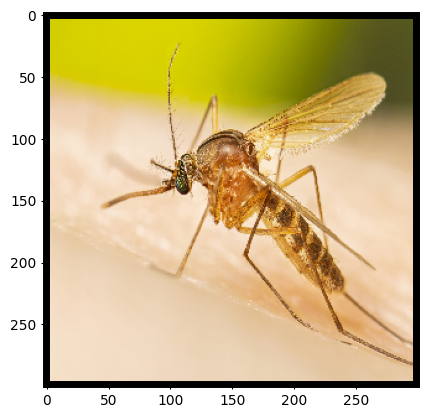

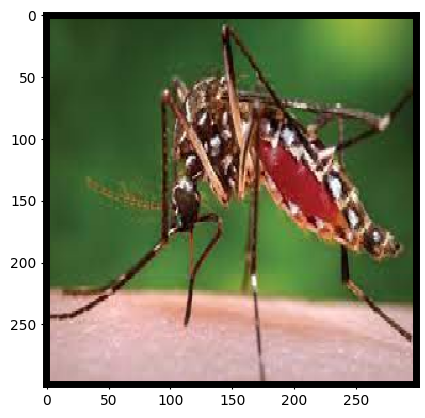

In [ ]:
# Load two test images from Internet
#!wget "https://www.todaysparent.com/wp-content/uploads/2021/01/make-sure-dog-likes-kids-1280x720-766x431.jpg"
!wget "https://techno.varee.ac.th/6510421001//Culex_quinquefasciatus_2022_005.jpg"

#!wget "https://keras.io/img/examples/vision/grad_cam/grad_cam_12_0.jpg"
#!wget "https://media.ttbbank.com/1/product-detail-v2/13ddeb84-d3eb-4d60-98b6-d2b798208e5b.png"
!wget "https://techno.varee.ac.th/6510421001/Aedes1.jpg"


# Load images as PIL.Image.Image
#img_path1 = 'make-sure-dog-likes-kids-1280x720-766x431.jpg'
img_path1 = 'Culex_quinquefasciatus_2022_005.jpg'
#img_path2 = 'grad_cam_12_0.jpg'
img_path2 = 'Aedes1.jpg'




#img1 =  tf.keras.preprocessing.image.load_img(img_path1, target_size=(224, 224))
#img2 =  tf.keras.preprocessing.image.load_img(img_path2, target_size=(224, 224))

img1 =  tf.keras.preprocessing.image.load_img(img_path1, target_size=(299, 299))
img2 =  tf.keras.preprocessing.image.load_img(img_path2, target_size=(299, 299))


# Convert PIL Images to NumPy ndarrays
img1 = tf.keras.preprocessing.image.img_to_array(img1).astype(np.uint8)
img2 = tf.keras.preprocessing.image.img_to_array(img2).astype(np.uint8)

# Display the NumPy images
plt.imshow(img1); plt.show()
plt.imshow(img2); plt.show()

In [ ]:
 # Preprocess the input images according to VGG16's requirements
#img_preprocess1 = tf.keras.applications.vgg16.preprocess_input( np.expand_dims(img1, axis=0) )
#img_preprocess2 = tf.keras.applications.vgg16.preprocess_input( np.expand_dims(img2, axis=0) )
#img_preprocess1   = tf.keras.applications.MobileNetV2.preprocess_input( np.expand_dims(img1, axis=0) )
#img_preprocess1   = tf.keras.applications.MobileNetV2.preprocess_input( np.expand_dims(img2, axis=0) )

# Preprocess the input images according to VGG16's requirements
img_preprocess1 = tf.keras.applications.vgg16.preprocess_input( np.expand_dims(img1, axis=0) )
img_preprocess2 = tf.keras.applications.vgg16.preprocess_input( np.expand_dims(img2, axis=0) )

#img_preprocess2 = tf.keras.applications.vgg16.preprocess_input( np.expand_dims(img2, axis=0) )

In [ ]:
# Our modified model
out_linear1, _ = new_model.predict( img_preprocess1 )
out_linear2, _ = new_model.predict( img_preprocess2 )

imagenet_dict, result1 = my_imagenet_decode_predictions( out_linear1, top=10 )
imagenet_dict, result2 = my_imagenet_decode_predictions( out_linear2, top=10 )
print( result1 )
print( result2 )

NameError: ignored

In [ ]:
def my_CNN_GradCAM( model, in_img, class_index, normalize=True ):
  '''
  A function to compute a GradCAM heatmap image

  Inputs:
    model (Keras's model): the target model that is specially prepared to be inspected by GradCAM
    in_img (NumPy array): an image to be inspected
    class_index (int, 0-999): an ImageNet's class index that we want to inspect its GradCAM heatmap
    normalize (bool): if True, normalize the resultant heatmap to [0,1]

  Outputs:
    An image of GradCAM heatmap
  '''
  # Convert from numpy to tensor
  in_img = tf.cast( in_img, tf.float32 )

  # Compute the gradient of y_c with respect to A_i
  with tf.GradientTape() as tape:
    tape.watch(in_img)
    y_linear, last_conv_activation = model( in_img )
    one_class_score = y_linear[ ..., class_index ]
  gradient = tape.gradient( one_class_score, last_conv_activation )  # tensor: shape=(1,7,7,512)

  # Compute a vector of alphas by averaging each 2D gradient
  # Note that, one alpha value refers to a single weight value for a 2D feature map
  gradient = gradient.numpy().squeeze(axis=0)    # numpy: shape=(7,7,512)
  alpha = np.mean( gradient, axis=(0,1) )   # numpy: shape=(512,)

  # Compute the weighted-sum heatmap
  last_conv_activation = last_conv_activation.numpy().squeeze(axis=0)   # numpy: shape (1,7,7,512) => (7,7,512)
  heatmap = np.dot( last_conv_activation, alpha )   # numpy: shape=(7,7)

  # Don't highlight any pixels with negative gradients (= apply ReLU)
  heatmap = np.maximum( 0, heatmap )     # numpy: shape=(7,7)

  # Return the heatmap
  return heatmap / np.max(heatmap) if normalize else heatmap

Test visualizing Grad-CAM for ImageNet classes with the 20 highest prediction scores

In [ ]:
def visualize_GradCAM_topresult( model, original_img, input_img, logit_preds, top=100, heatmap_norm=True):
  '''
  A utility function that helps visualize the GradCAM results on top of the input image

  Inputs:
    model (Keras's model): the target model that is specially prepared to be inspected by GradCAM
    original_img (Numpy): an input image to be visualized
    input_img (Numpy): a preprocessed image to be fed to the model
    logit_preds (Numpy): an array of 1000 raw prediction scores (logits, non-softmax scores) regarding the 'input_img'
    top (int): how many class with top prediciton scores will be visualized
    heatmap_norm (bool): if True, normalize the heatmap to [0,1]
  '''
  # Get predictions with highest scores
  _ , top_results = my_imagenet_decode_predictions( logit_preds, top=top )

  # Extract 0-based class indices
  top_index = [ tp[0] for tp in top_results[0] ]

  # Visualize Grad-CAM for each class whose index is in 'top_index'
  for i,c in enumerate(top_index):
    heatmap = my_CNN_GradCAM(  model,         # the CNN model
                               input_img,     # input of the model
                               c,             # the 0-based index of the output class to compute and visualize GradCAM
                               heatmap_norm
                           )

    # Create the main figure
    fig = plt.figure(figsize=(15,5))
    class_desc = f"{imagenet_dict[c][-1]}, Top {i+1}/{top} with a logit score of {logit_preds[...,c].squeeze():.4f}"
    class_desc += f", normalized" if heatmap_norm else f", unnormalized"
    fig.suptitle( f"ImageNet class no. {c}/{len(imagenet_dict)-1} ({class_desc})" )

    # Subplot 1
    # Visualize the original heatmap
    ax = fig.add_subplot(1, 2, 1)
    ax.set_title( "Original Grad-CAM" )
    im = ax.imshow( heatmap, cmap='jet' )
    plt.colorbar( im, ax=ax )

    # Subplot 2
    # Visualize the heatmap overlaid on an input image
    ax = fig.add_subplot(1, 2, 2)
    ax.set_title( "Resized Grad-CAM on an input image" )
    ax.imshow( original_img )
    alpha = 0.6
    im = ax.imshow( cv.resize( heatmap, original_img.shape[:2] ), cmap='jet', alpha=alpha )
    plt.colorbar( im, ax=ax )

    # Show this figure
    plt.show()

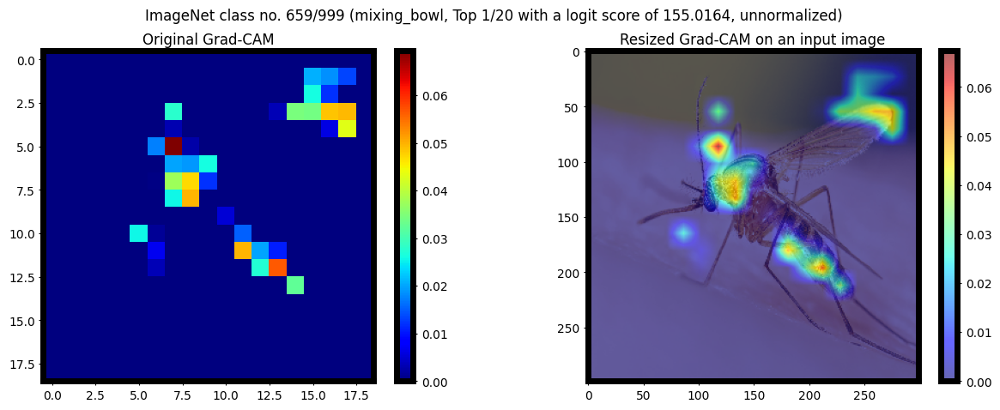

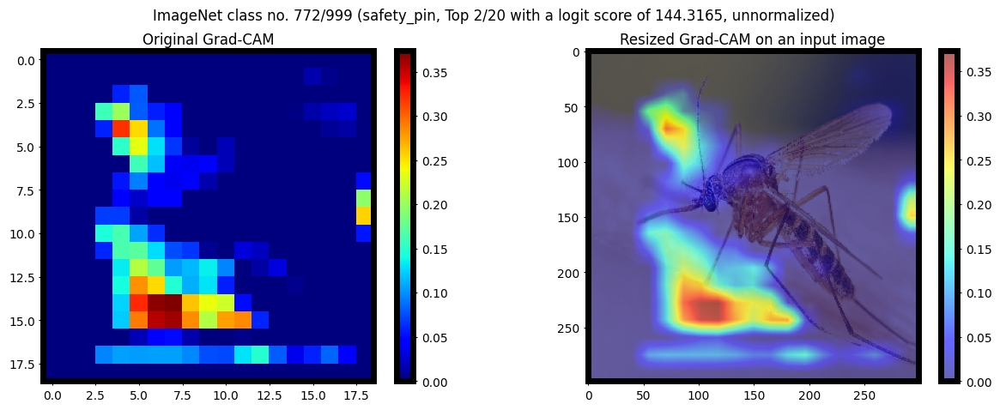

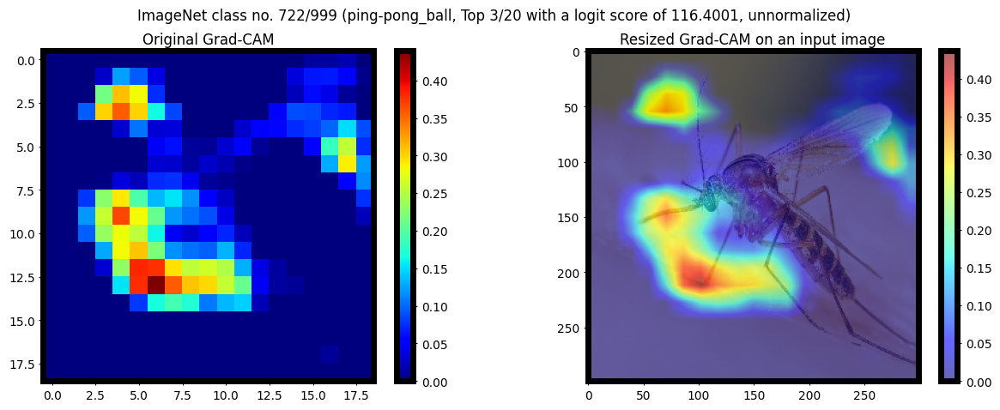

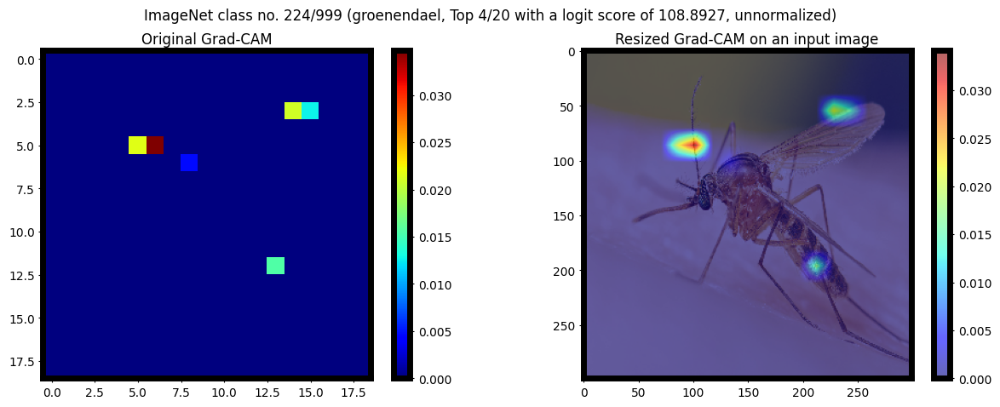

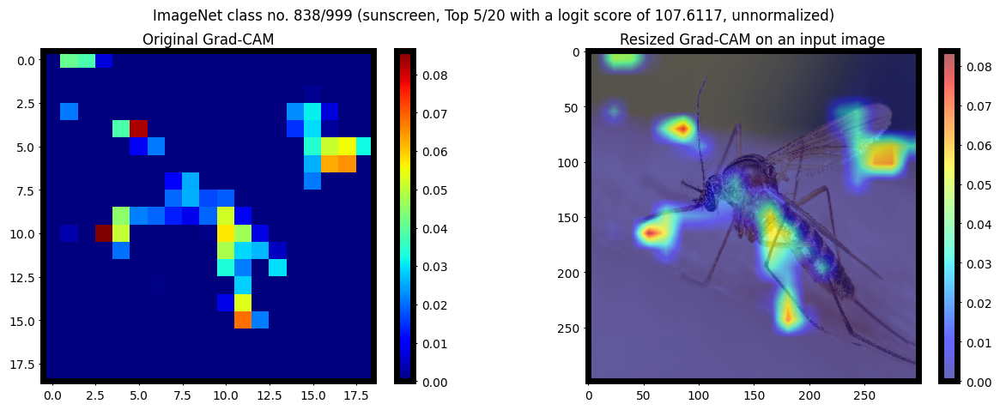

...

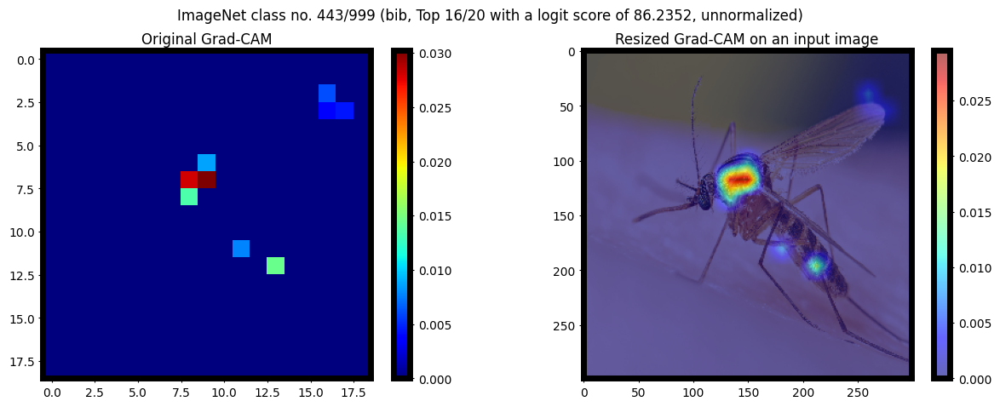

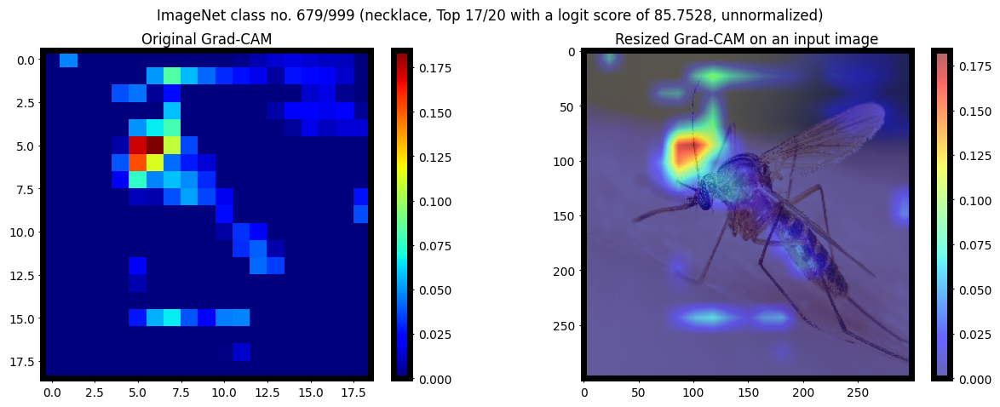

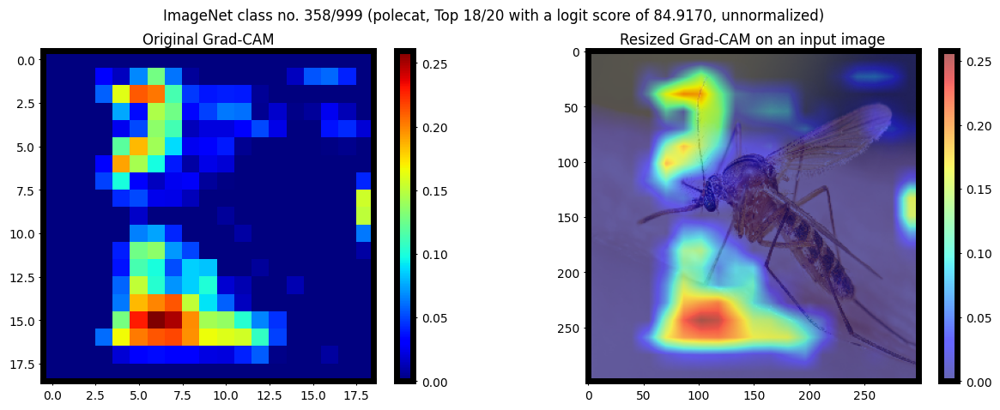

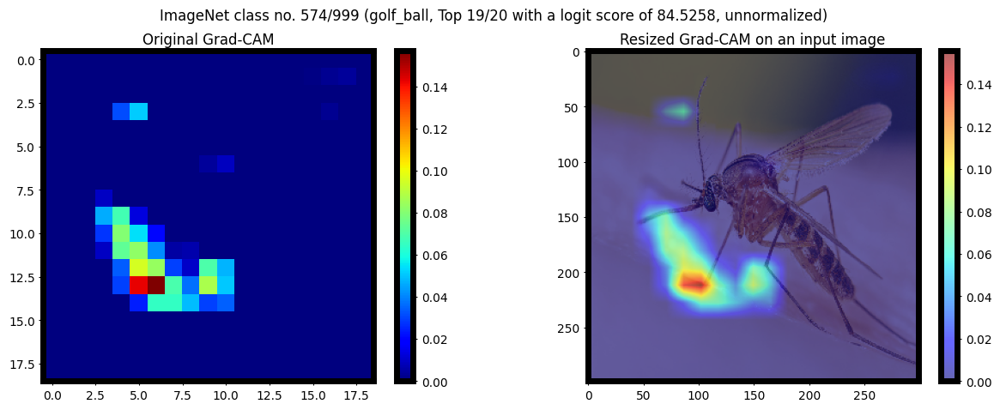

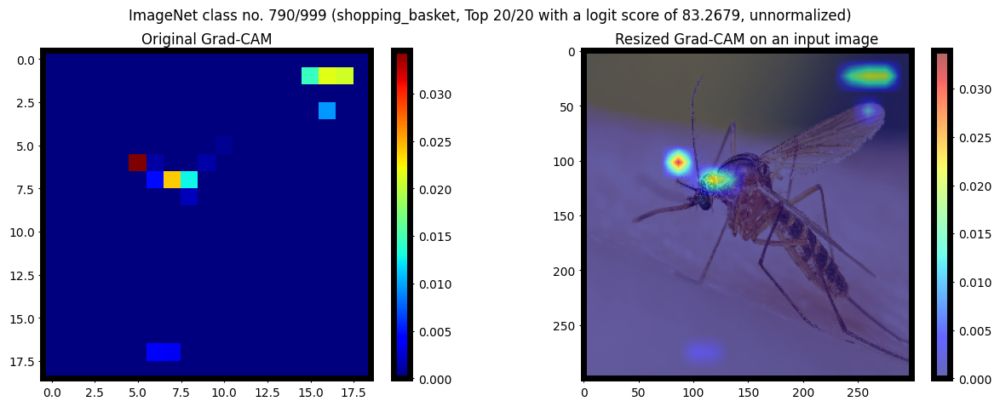

In [ ]:
visualize_GradCAM_topresult( new_model, img1, img_preprocess1, out_linear1, top=20, heatmap_norm=False)

In [ ]:
#-----------------------    Keras      ------------------------#

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm

--2023-11-04 13:23:15--  https://techno.varee.ac.th/6510421001//Culex_quinquefasciatus_2022_005.jpg
Resolving techno.varee.ac.th (techno.varee.ac.th)... 104.21.72.84, 172.67.177.141, 2606:4700:3030::6815:4854, ...
Connecting to techno.varee.ac.th (techno.varee.ac.th)|104.21.72.84|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 302709 (296K) [image/jpeg]
Saving to: ‘Culex_quinquefasciatus_2022_005.jpg.3’

Culex_quinquefascia 100%[===================>] 295.61K   416KB/s    in 0.7s    

2023-11-04 13:23:17 (416 KB/s) - ‘Culex_quinquefasciatus_2022_005.jpg.3’ saved [302709/302709]



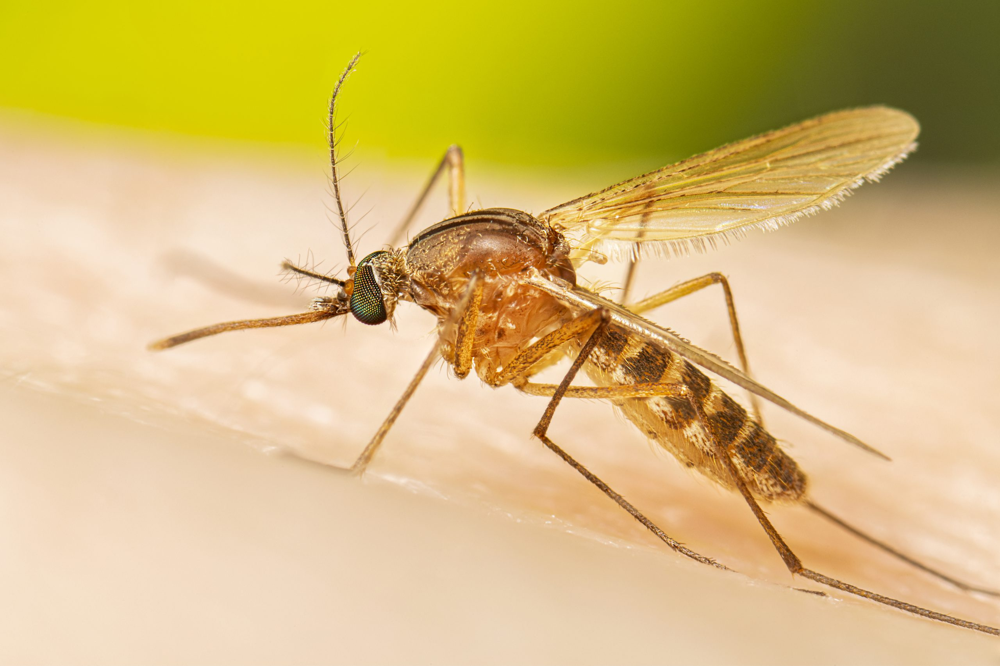

In [ ]:
model_builder = keras.applications.xception.Xception
img_size = (299, 299)
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions

last_conv_layer_name = "block14_sepconv2_act"

# The local path to our target image
#img_path = keras.utils.get_file(
 #   "african_elephant.jpg", "https://i.imgur.com/Bvro0YD.png"
#)

!wget "https://techno.varee.ac.th/6510421001//Culex_quinquefasciatus_2022_005.jpg"
img_path = 'Culex_quinquefasciatus_2022_005.jpg'

display(Image(img_path))

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

1/1 [==============================] - 1s 1s/step
Predicted: [('n02264363', 'lacewing', 6.085352)]


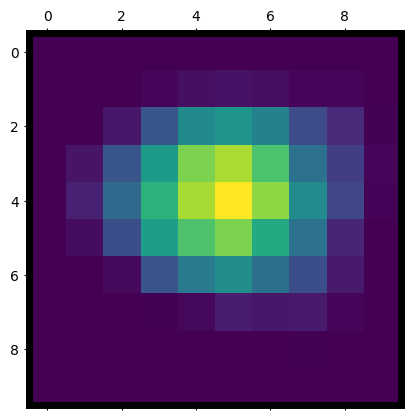

In [ ]:
# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Make model
model = model_builder(weights="imagenet")

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=1)[0])

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

<ipython-input-91-8a3df7f2985d>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


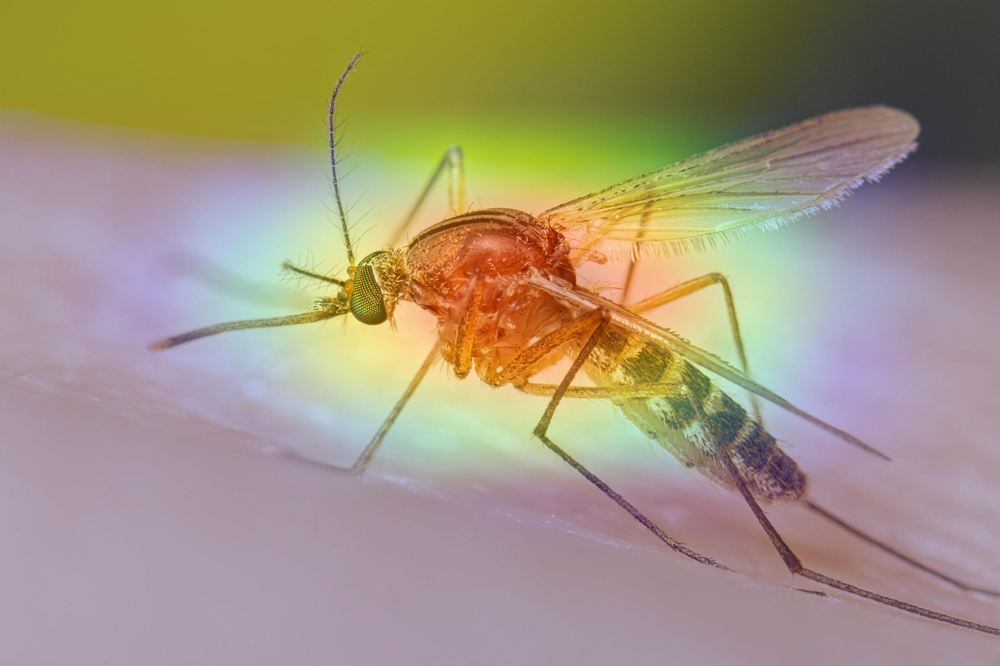

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

--2023-11-04 13:26:47--  https://techno.varee.ac.th/6510421001/Aedes1.jpg
Resolving techno.varee.ac.th (techno.varee.ac.th)... 172.67.177.141, 104.21.72.84, 2606:4700:3030::6815:4854, ...
Connecting to techno.varee.ac.th (techno.varee.ac.th)|172.67.177.141|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6838 (6.7K) [image/jpeg]
Saving to: ‘Aedes1.jpg.4’

Aedes1.jpg.4        100%[===================>]   6.68K  --.-KB/s    in 0s      

2023-11-04 13:26:49 (74.9 MB/s) - ‘Aedes1.jpg.4’ saved [6838/6838]



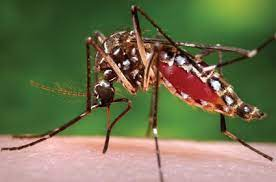

1/1 [==============================] - 0s 325ms/step
Predicted: [('n02165105', 'tiger_beetle', 7.6517897), ('n02168699', 'long-horned_beetle', 6.4856534)]


In [ ]:
#img_path = keras.utils.get_file(
#   "cat_and_dog.jpg",
#   "https://storage.googleapis.com/petbacker/images/blog/2017/dog-and-cat-cover.jpg",
#)

!wget "https://techno.varee.ac.th/6510421001/Aedes1.jpg"
img_path = 'Aedes1.jpg'

display(Image(img_path))

# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Print what the two top predicted classes are
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=2)[0])

<ipython-input-91-8a3df7f2985d>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


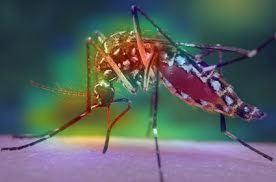

In [ ]:
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=260)

save_and_display_gradcam(img_path, heatmap)

<ipython-input-91-8a3df7f2985d>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


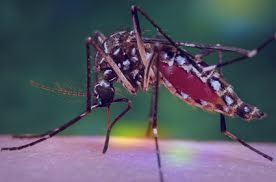

In [ ]:
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=285)

save_and_display_gradcam(img_path, heatmap)